# Isochrone map to explore the walkability of a city

In [19]:
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import Point
from shapely.geometry import Polygon

%matplotlib inline

In [20]:
ox.config(log_console=False, use_cache=True)

C:\Users\lea\AppData\Roaming\Python\Python310\site-packages\osmnx\utils.py:192: UserWarning: The `utils.config` function is deprecated and will be removed in a future release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`.
  warnings.warn(


In [21]:
# configure the place, network type, trip times, and travel speed
place = "Menzelstr. 46, Duisburg, Germany"
network_type = "walk"
trip_times = [5, 10, 15]  # in minutes
travel_speed = 4.5  # walking speed in km/hour

## Download and prep the street network

In [22]:
# download the street network
G = ox.graph_from_address(place, network_type=network_type)

In [23]:
# find the centermost node and then project the graph to UTM
gdf_nodes = ox.graph_to_gdfs(G, edges=False)
x, y = gdf_nodes["geometry"].unary_union.centroid.xy
center_node = ox.distance.nearest_nodes(G, x[0], y[0])
G = ox.project_graph(G)

In [24]:
# add an edge attribute for time in minutes required to traverse each edge
meters_per_minute = travel_speed * 1000 / 60  # km per hour to m per minute
for _, _, _, data in G.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute

## Plots nodes you can reach on foot within each time

How far can you walk in 5, 10, 15, 20, and 25 minutes from the origin node? We'll use NetworkX to induce a subgraph of G within each distance, based on trip time and travel speed.


In [25]:
# get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap="autumn", start=0, return_hex=True)

## Plot the time-distances as isochrones

How far can you walk in 5, 10, 15, 20, and 25 minutes from the origin node? We'll use a convex hull, which isn't perfectly accurate. A concave hull would be better, but shapely doesn't offer that.


In [26]:
# make the isochrone polygons
isochrone_polys = []
for trip_time in sorted(trip_times, reverse=True):
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")
    node_points = [Point((data["x"], data["y"])) for node, data in subgraph.nodes(data=True)]
    bounding_poly = gpd.GeoSeries(node_points).unary_union.convex_hull
    isochrone_polys.append(bounding_poly)

In [27]:
# get amenities for place
amenities = ox.geometries_from_address(place, tags={"amenity":True}, dist=1200)

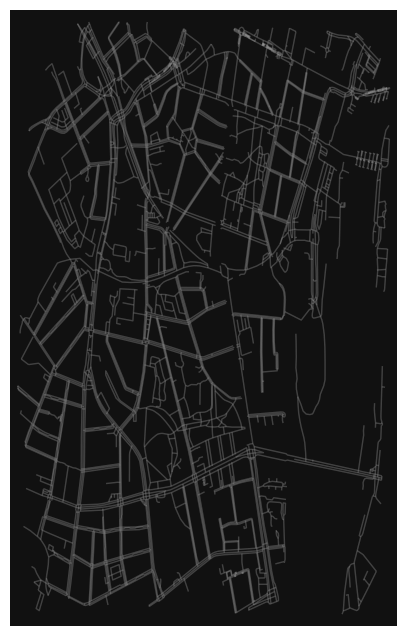

In [35]:
# plot the network, add isochrones as colored descartes polygon patches, then add amenities
fig, ax = ox.plot_graph(
    G, show=False, close=False, edge_color="#999999", edge_alpha=0.2, node_size=0
)
for polygon, fc in zip(isochrone_polys, iso_colors):
    patch = PolygonPatch(polygon, fc=fc, ec="none", alpha=0.6, zorder=-1)
    ax.add_patch(patch)
    
amenities.plot(color="white", markersize=1, ax=ax)
plt.show()

### color the nodes according to isochrone then plot the street network
node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else "none" for node in G.nodes()]
ns = [15 if node in node_colors else 0 for node in G.nodes()]
fig, ax = ox.plot_graph(
    G,
    node_color=nc,
    node_size=ns,
    node_alpha=0.8,
    edge_linewidth=0.2,
    edge_color="#999999",
)

Or, plot isochrones as buffers to get more faithful isochrones than convex hulls can offer

In [32]:
def make_iso_polys(G, edge_buff=25, node_buff=50, infill=False):
    isochrone_polys = []
    for trip_time in sorted(trip_times, reverse=True):
        subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")

        node_points = [Point((data["x"], data["y"])) for node, data in subgraph.nodes(data=True)]
        nodes_gdf = gpd.GeoDataFrame({"id": list(subgraph.nodes)}, geometry=node_points)
        nodes_gdf = nodes_gdf.set_index("id")

        edge_lines = []
        for n_fr, n_to in subgraph.edges():
            f = nodes_gdf.loc[n_fr].geometry
            t = nodes_gdf.loc[n_to].geometry
            edge_lookup = G.get_edge_data(n_fr, n_to)[0].get("geometry", LineString([f, t]))
            edge_lines.append(edge_lookup)

        n = nodes_gdf.buffer(node_buff).geometry
        e = gpd.GeoSeries(edge_lines).buffer(edge_buff).geometry
        all_gs = list(n) + list(e)
        new_iso = gpd.GeoSeries(all_gs).unary_union

        # try to fill in surrounded areas so shapes will appear solid and
        # blocks without white space inside them
        if infill:
            new_iso = Polygon(new_iso.exterior)
        isochrone_polys.append(new_iso)
    return isochrone_polys

isochrone_polys = make_iso_polys(G, edge_buff=25, node_buff=0, infill=True)
fig, ax = ox.plot_graph(G, 
    node_size=0,
    edge_linewidth=1,
    show=False,
    close=False,
    edge_color="#999999", 
    edge_alpha=0.2
)


for polygon, fc in zip(isochrone_polys, iso_colors):
    patch = PolygonPatch(polygon, fc=fc, ec="none", alpha=0.5, zorder=-1)
    ax.add_patch(patch)

ax1.scatter(6.762620, 51.424519, c="white")

#amenities.plot(color="white", markersize=1, ax=ax)
    
plt.show()

IndentationError: expected an indented block after 'for' statement on line 40 (4289991942.py, line 44)

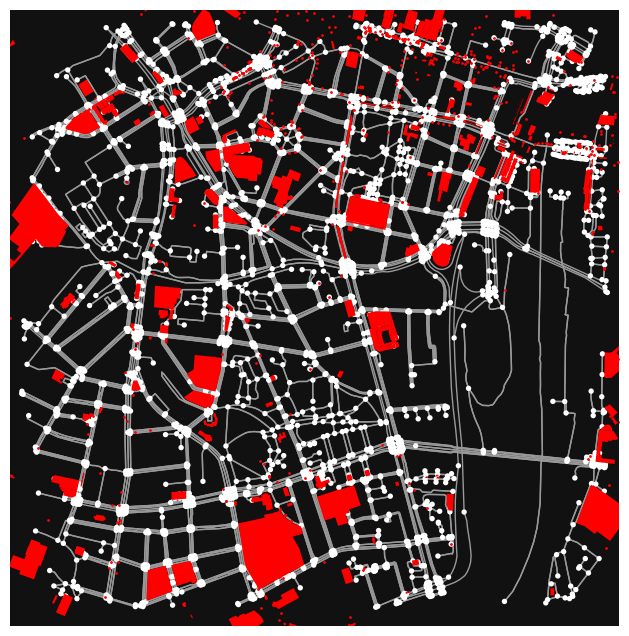

In [63]:
A = ox.graph_from_address('Menzelstrasse 46, Duisburg', 
                          dist=1000)

fig1, ax1 = ox.plot_graph(A, show=False, close=False)

amenities.plot(color="red", markersize=1, ax=ax1)

plt.show()

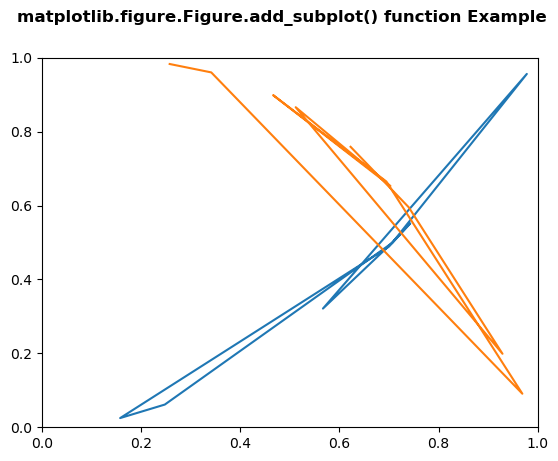

In [14]:
import numpy as np
   
  
np.random.seed(19680801)
  
xdata = np.random.random([2, 10])
  
xdata1 = xdata[0, :]
xdata2 = xdata[1, :]
  
ydata1 = xdata1 ** 2
ydata2 = 1 - xdata2 ** 3
   
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.plot(xdata1, ydata1, color ='tab:blue')
ax.plot(xdata2, ydata2, color ='tab:orange')
   
ax.set_xlim([0, 1])
ax.set_ylim([0, 1])
fig.suptitle('matplotlib.figure.Figure.add_subplot() \
function Example\n\n', fontweight ="bold")
  
plt.show()

C:\Users\lea\.conda\envs\geo_env\lib\site-packages\geopandas\plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


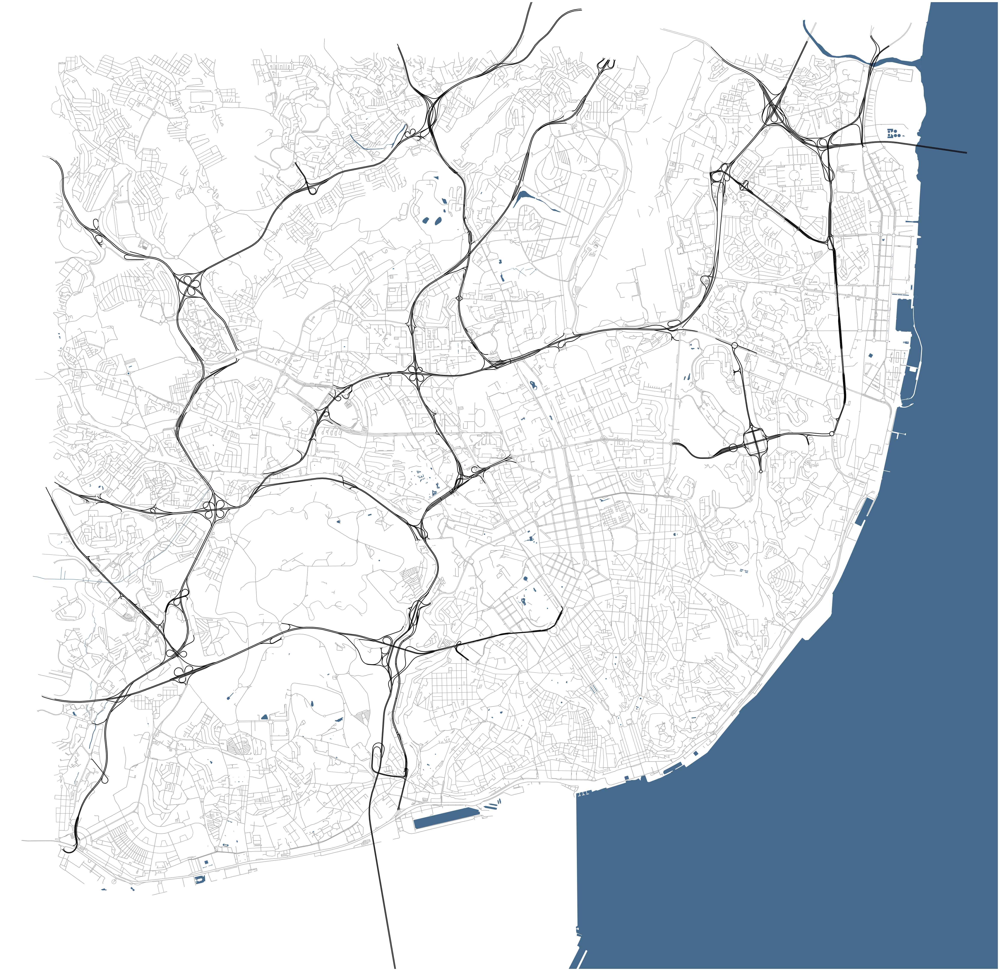

In [24]:
bbox = [38.7969489, 38.6919296, -9.088, -9.2296891]

# Query graph for Lisbon
G = ox.graph_from_bbox(
    *bbox,
    simplify=True,
    retain_all=True,
    clean_periphery=True,
    truncate_by_edge=True,
    network_type="drive_service",
)

# Find additional geometries
water_1 = ox.geometries_from_bbox(*bbox, tags={"natural": ["water"]})
water_2 = ox.geometries_from_bbox(
    *bbox,
    tags={
        "waterway": ["riverbank", "canal", "dock"],
        "water": ["river", "canal", "reservoir"],
        "natural": ["bay"],
    },
)
water_3 = ox.geometries_from_bbox(*bbox, tags={"place": ["sea", "ocean"]})
motoway = ox.geometries_from_bbox(
    *bbox,
    tags={
        "highway": [
            "motorway",
            "motorway_link",
            "trunk",
            "trunk_link",
        ]
    },
)

# PLOT
fig, ax = ox.plot_graph(
    G,
    bgcolor="white",
    node_size=0,
    edge_linewidth=1,
    show=False,
    close=False,
    figsize=(60, 80),
    dpi=100,
    save=True,
    filepath="lisbon.jpg",
)

water_1.plot(color="#466A8C", linewidth=1, ax=ax)
water_2.plot(color="#466A8C", linewidth=1, ax=ax)
water_3.plot(color="#466A8C", linewidth=1, ax=ax)
motoway.plot(color="#000000", linewidth=2, ax=ax)

plt.show()